In [4]:
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.8/54.8 MB 7.4 MB/s eta 0:00:0000:0100:01


In [5]:

#dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"

Number of images found: 4000
Number of folders found: 8


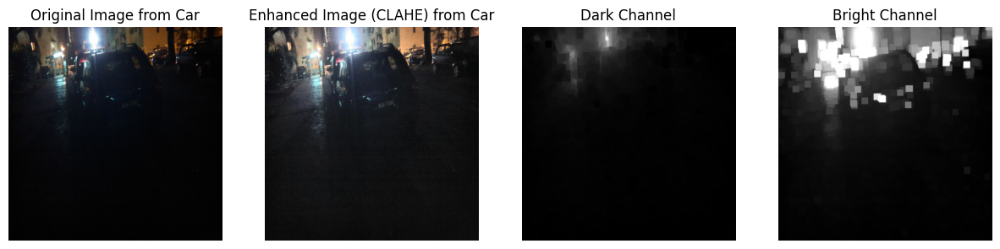

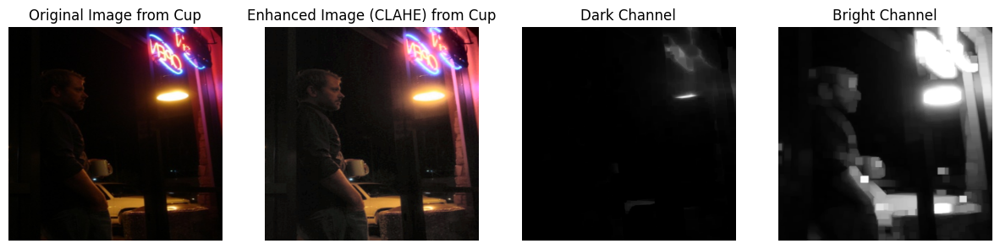

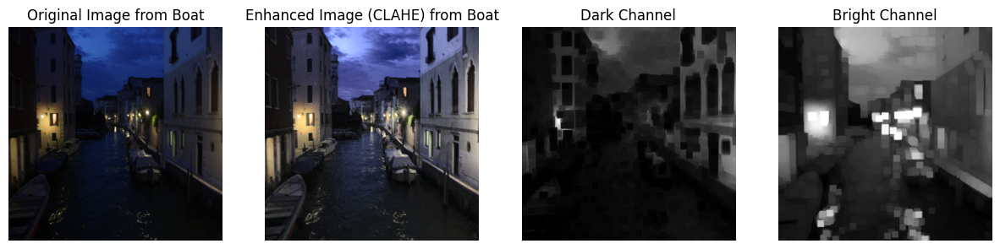

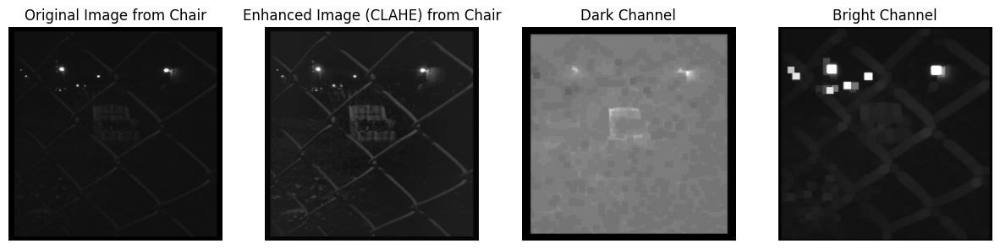

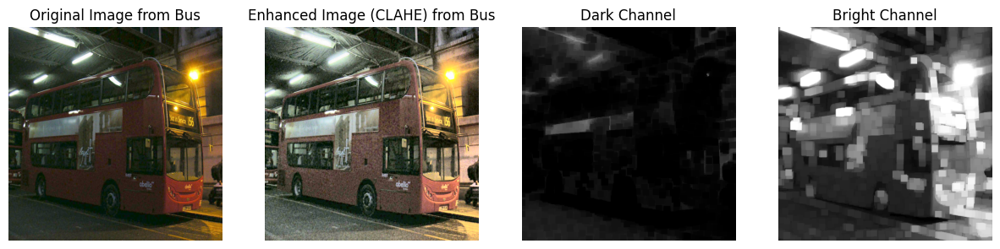

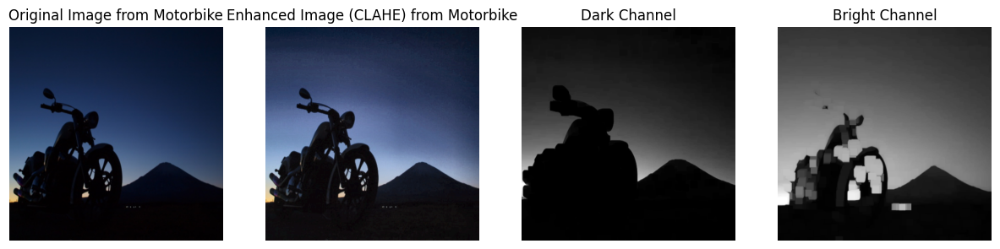

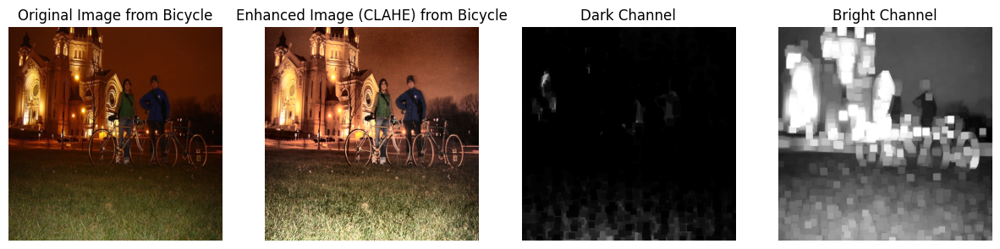

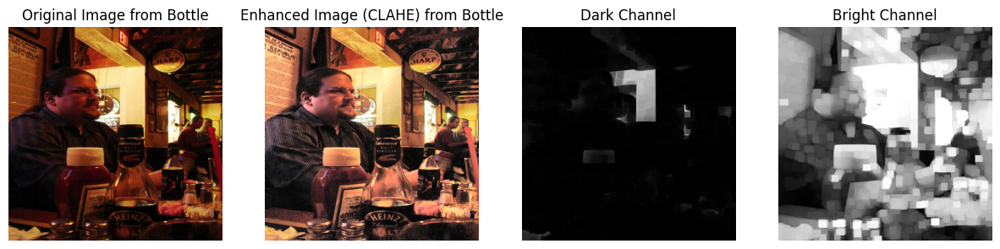

Sequential execution time: 23.30708808300551 seconds


In [43]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from timeit import timeit

# Functions for dark and bright channel estimation
def estimatedarkchannel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimatebrightchannel(im, sz):
    b, g, r = cv2.split(im)
    bc = cv2.max(cv2.max(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    bright = cv2.dilate(bc, kernel)
    return bright

# CLAHE for image enhancement
def enhance_image_clahe(im):
    lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)  # Convert to LAB color space
    l, a, b = cv2.split(lab)  # Split LAB channels
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(4,4))  # Create CLAHE object
    cl = clahe.apply(l)  # Apply CLAHE to L-channel
    limg = cv2.merge((cl, a, b))  # Merge enhanced L-channel back
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)  # Convert back to BGR
    return enhanced_img

# Load the ExDark dataset
dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"
image_paths = []
folders = set()  # To keep track of unique folders

for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.endswith(".jpg"):
            image_paths.append(os.path.join(root, file))
            folders.add(root)  # Add the folder path

# Debugging: Check if images are loaded
print(f"Number of images found: {len(image_paths)}")
print(f"Number of folders found: {len(folders)}")

# Sequential processing: Enhance images and display one from each class
def process_images():
    displayed_images = set()  # To track displayed images

    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Could not load image: {img_path}")
            continue

        img_resized = cv2.resize(img, (512, 512))  # Resize to 512x512
        enhanced_img = enhance_image_clahe(img_resized)  # Apply CLAHE for enhancement
        
        # Dark and Bright channel estimations
        dark_channel = estimatedarkchannel(img_resized, 15)
        bright_channel = estimatebrightchannel(img_resized, 15)

        # Display only one image per folder
        folder_name = os.path.basename(os.path.dirname(img_path))
        if folder_name not in displayed_images:
            displayed_images.add(folder_name)

            # Display the original image, enhanced image, dark channel, and bright channel
            plt.figure(figsize=(15, 5))

            # Original image
            plt.subplot(1, 4, 1)
            plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
            plt.title(f'Original Image from {folder_name}')
            plt.axis('off')

            # Enhanced image
            plt.subplot(1, 4, 2)
            plt.imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB))
            plt.title(f'Enhanced Image (CLAHE) from {folder_name}')
            plt.axis('off')

            # Dark channel
            plt.subplot(1, 4, 3)
            plt.imshow(dark_channel, cmap='gray')
            plt.title('Dark Channel')
            plt.axis('off')

            # Bright channel
            plt.subplot(1, 4, 4)
            plt.imshow(bright_channel, cmap='gray')
            plt.title('Bright Channel')
            plt.axis('off')

            plt.show()

# Function to benchmark the image processing
def benchmark_image_processing():
    process_images()

# Benchmark the sequential code
execution_time = timeit(benchmark_image_processing, number=1)  # Measure execution time for a single run
print(f"Sequential execution time: {execution_time} seconds")


Sequential execution time: 21.200078916968778 seconds


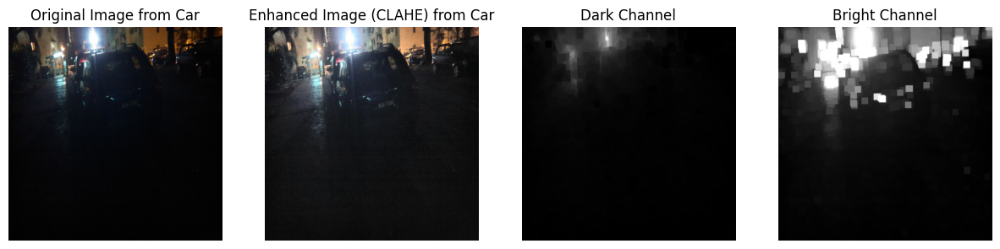

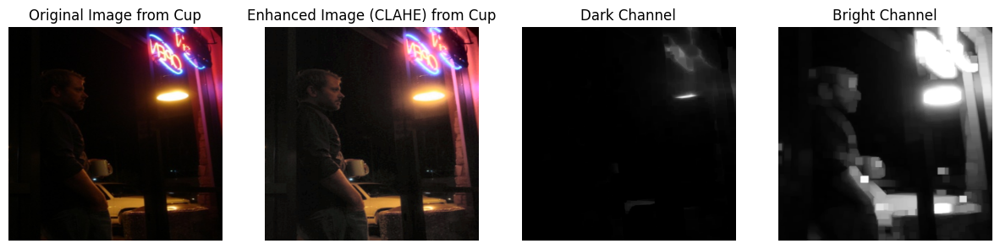

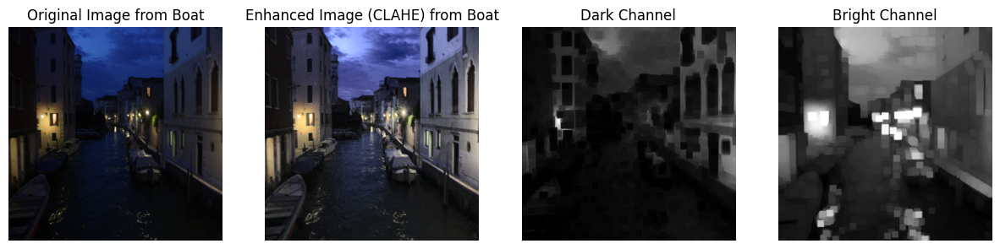

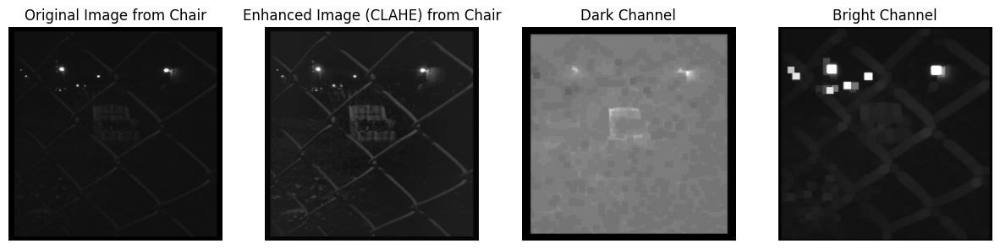

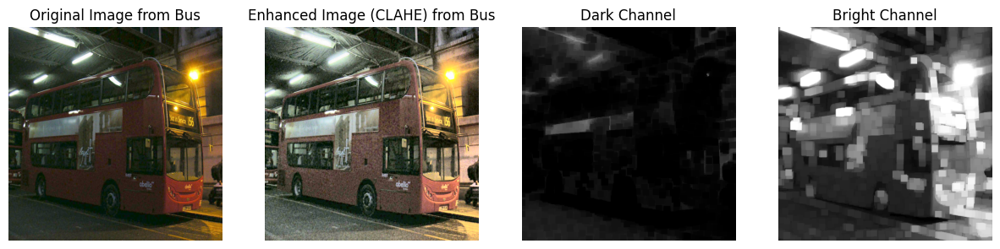

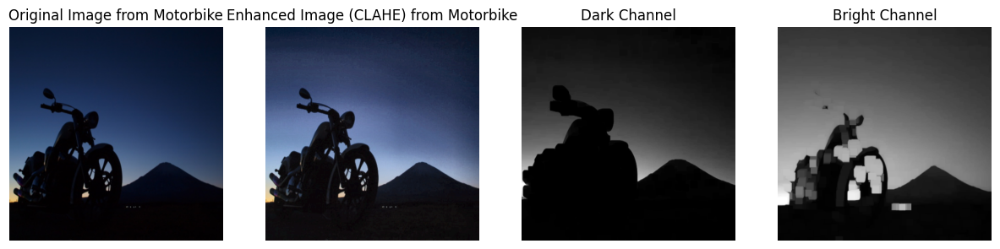

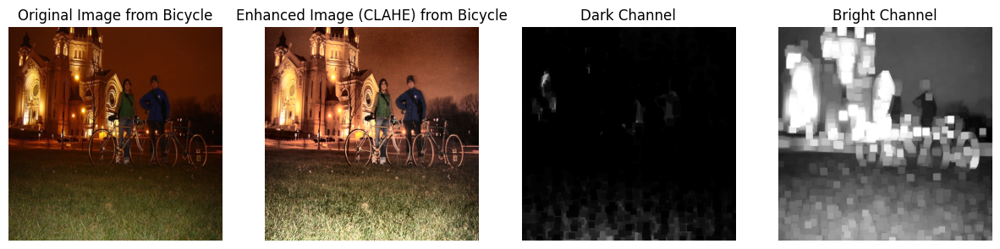

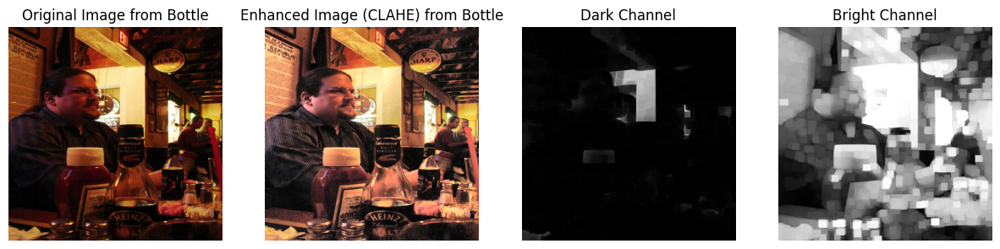

         2389967 function calls (2319537 primitive calls) in 21.670 seconds

   Ordered by: standard name

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.001    0.001   21.670   21.670 3054711424.py:3(benchmark_image_processing)
     4000    0.011    0.000    0.917    0.000 3589991453.py:15(estimatebrightchannel)
     4000    0.017    0.000    3.839    0.001 3589991453.py:23(enhance_image_clahe)
        1    2.005    2.005   21.669   21.669 3589991453.py:48(process_images)
     4000    0.017    0.000    1.193    0.000 3589991453.py:8(estimatedarkchannel)
      416    0.000    0.000    0.001    0.000 <frozen _collections_abc>:778(__contains__)
      288    0.000    0.000    0.000    0.000 <frozen _collections_abc>:794(values)
      288    0.000    0.000    0.000    0.000 <frozen _collections_abc>:812(__init__)
      160    0.000    0.000    0.000    0.000 <frozen _collections_abc>:815(__len__)
     1440    0.001    0.000    0.001    0.000 <frozen 

In [47]:
import cProfile

def benchmark_image_processing():
    process_images()

print(f"Sequential execution time: {execution_time} seconds")
# Profile the function to see where time is spent
cProfile.run('benchmark_image_processing()')

Number of images found: 4000
Number of folders found: 8


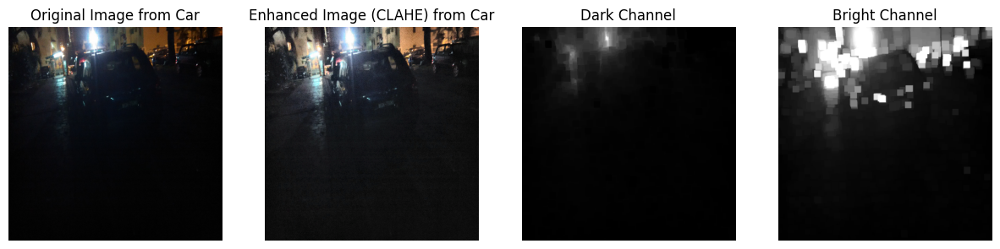

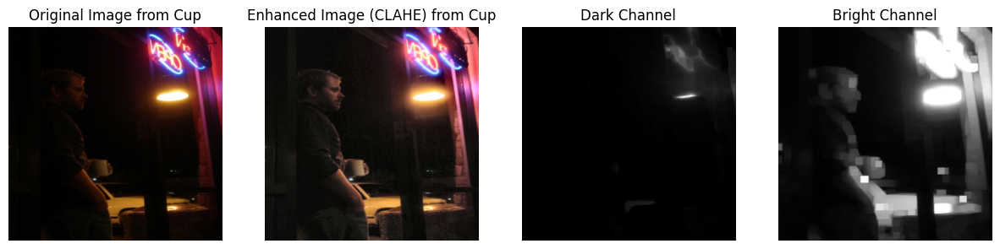

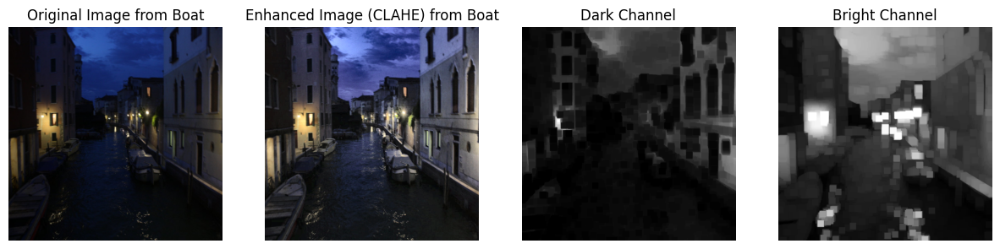

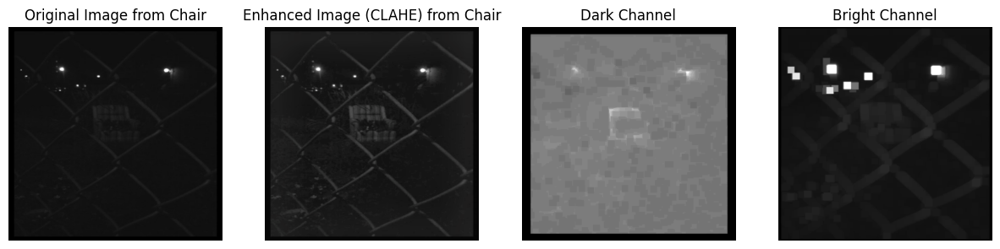

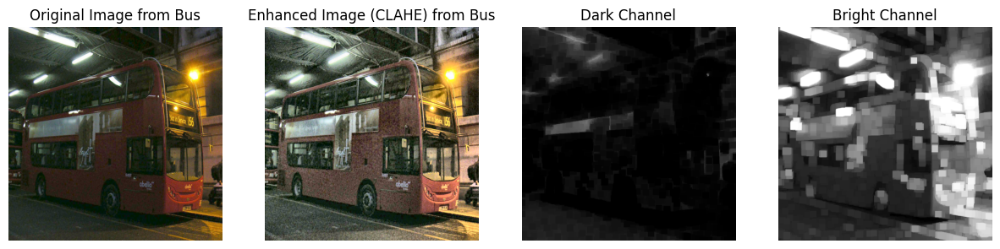

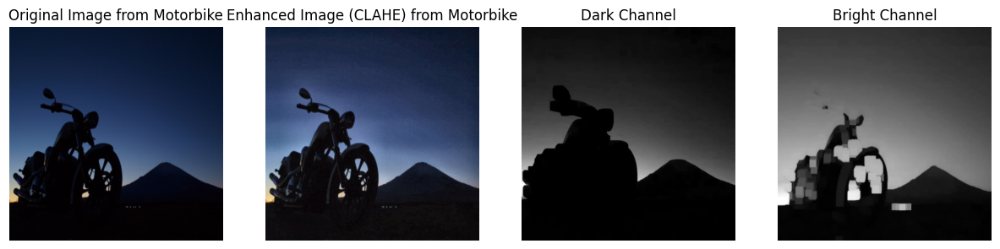

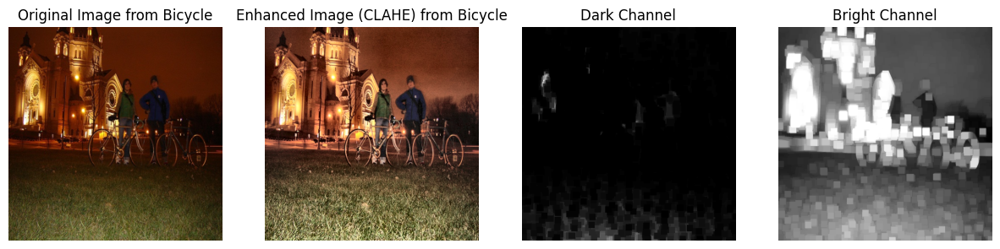

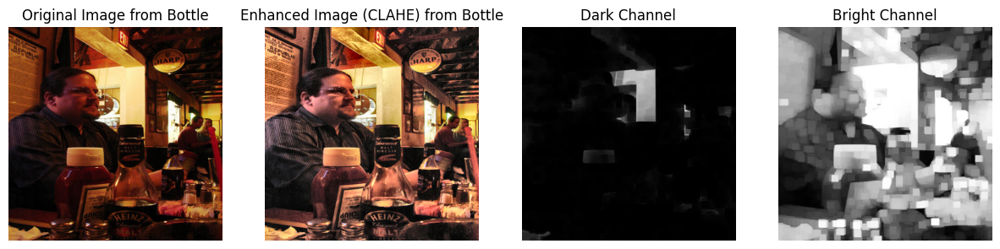

Sequential execution time: 22.440462583035696 seconds


In [29]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from timeit import timeit

# Functions for dark and bright channel estimation
def estimatedarkchannel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimatebrightchannel(im, sz):
    b, g, r = cv2.split(im)
    bc = cv2.max(cv2.max(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    bright = cv2.dilate(bc, kernel)
    return bright

# CLAHE for image enhancement
def enhance_image_clahe(im):
    lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)  # Convert to LAB color space
    l, a, b = cv2.split(lab)  # Split LAB channels
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))  # Create CLAHE object
    cl = clahe.apply(l)  # Apply CLAHE to L-channel
    limg = cv2.merge((cl, a, b))  # Merge enhanced L-channel back
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)  # Convert back to BGR
    return enhanced_img

# Load the ExDark dataset
dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"
image_paths = []
folders = set()  # To keep track of unique folders

for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.endswith(".jpg"):
            image_paths.append(os.path.join(root, file))
            folders.add(root)  # Add the folder path

# Check if images are loaded
print(f"Number of images found: {len(image_paths)}")
print(f"Number of folders found: {len(folders)}")

# Sequential processing: Enhance images and display one from each class
def process_images():
    displayed_images = set()  # To track displayed images

    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Could not load image: {img_path}")
            continue

        img_resized = cv2.resize(img, (512, 512))  # Resize to 512x512
        enhanced_img = enhance_image_clahe(img_resized)  # Apply CLAHE for enhancement
        
        # Dark and Bright channel estimations
        dark_channel = estimatedarkchannel(img_resized, 15)
        bright_channel = estimatebrightchannel(img_resized, 15)

        # Display only one image per folder
        folder_name = os.path.basename(os.path.dirname(img_path))
        if folder_name not in displayed_images:
            displayed_images.add(folder_name)

            # Display the original image, enhanced image, dark channel, and bright channel
            plt.figure(figsize=(15, 5))

            # Original image
            plt.subplot(1, 4, 1)
            plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
            plt.title(f'Original Image from {folder_name}')
            plt.axis('off')

            # Enhanced image
            plt.subplot(1, 4, 2)
            plt.imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB))
            plt.title(f'Enhanced Image (CLAHE) from {folder_name}')
            plt.axis('off')

            # Dark channel
            plt.subplot(1, 4, 3)
            plt.imshow(dark_channel, cmap='gray')
            plt.title('Dark Channel')
            plt.axis('off')

            # Bright channel
            plt.subplot(1, 4, 4)
            plt.imshow(bright_channel, cmap='gray')
            plt.title('Bright Channel')
            plt.axis('off')

            plt.show()

# Function to benchmark the image processing
def benchmark_image_processing():
    process_images()

# Benchmark the sequential code
execution_time = timeit(benchmark_image_processing, number=1)  
print(f"Sequential execution time: {execution_time} seconds")


ASSIGNMENT 2 EXPERIMENTS 

In [40]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor
from timeit import default_timer as timer

Number of images found: 4000
Number of folders found: 8


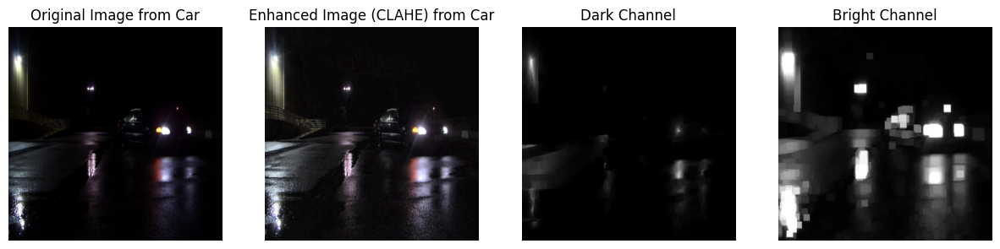

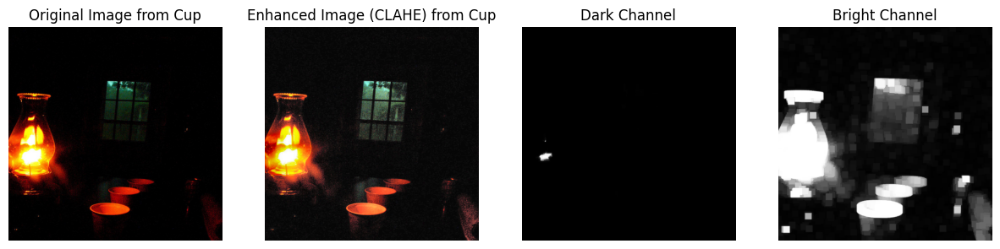

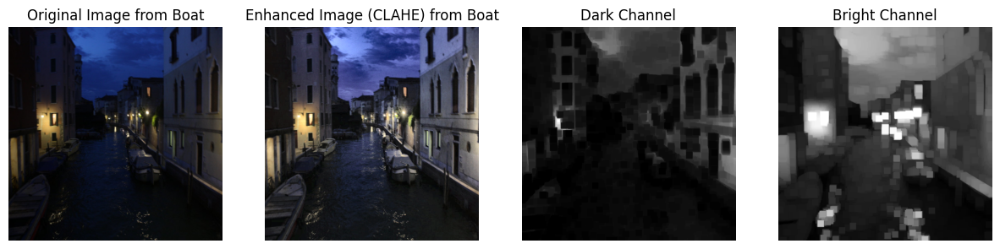

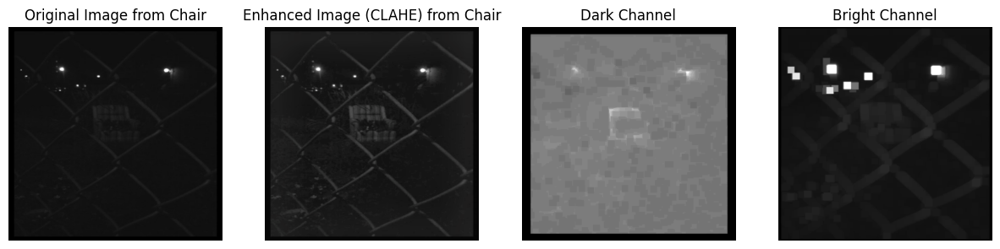

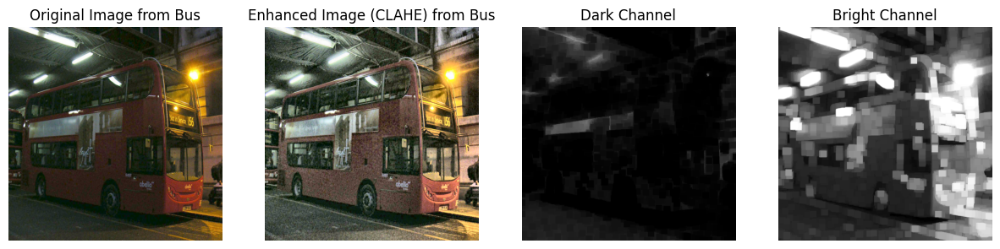

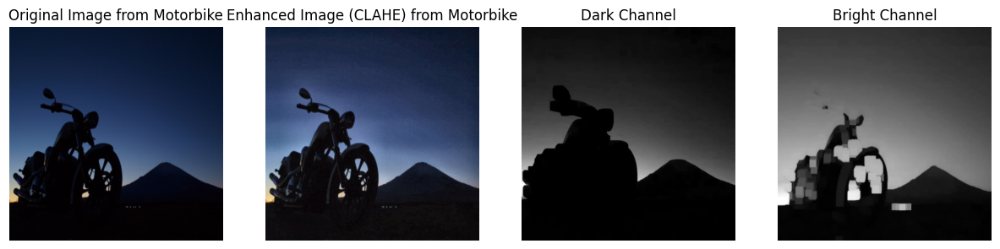

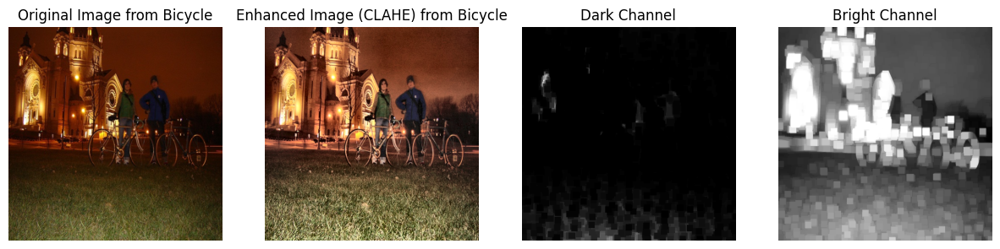

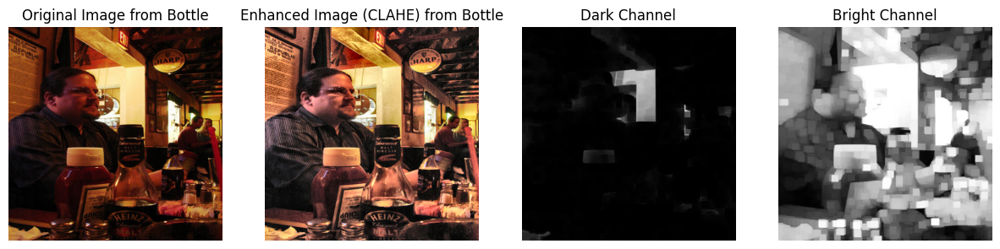

Parallel execution time: 14.613982209004462 seconds


In [46]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor
from timeit import timeit

# Functions for dark and bright channel estimation
def estimatedarkchannel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimatebrightchannel(im, sz):
    b, g, r = cv2.split(im)
    bc = cv2.max(cv2.max(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    bright = cv2.dilate(bc, kernel)
    return bright

# CLAHE for image enhancement
def enhance_image_clahe(im):
    lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)  # Convert to LAB color space
    l, a, b = cv2.split(lab)  # Split LAB channels
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))  # Create CLAHE object
    cl = clahe.apply(l)  # Apply CLAHE to L-channel
    limg = cv2.merge((cl, a, b))  # Merge enhanced L-channel back
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)  # Convert back to BGR
    return enhanced_img

# Load the ExDark dataset
dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"
image_paths = []
folders = set()  # To keep track of unique folders

for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.endswith(".jpg"):
            image_paths.append(os.path.join(root, file))
            folders.add(root)  # Add the folder path

# Debugging: Check if images are loaded
print(f"Number of images found: {len(image_paths)}")
print(f"Number of folders found: {len(folders)}")

# Shared resource: displayed_images
displayed_images = set()

def process_img(img_path):
    global displayed_images  # Shared resource

    img = cv2.imread(img_path)
    if img is None:
        print(f"Could not load image: {img_path}")
        return

    img_resized = cv2.resize(img, (512, 512))  # Resize to 512x512
    enhanced_img = enhance_image_clahe(img_resized)  # Apply CLAHE for enhancement

    # Dark and Bright channel estimations
    dark_channel = estimatedarkchannel(img_resized, 15)
    bright_channel = estimatebrightchannel(img_resized, 15)

    # Introduce potential race condition with displayed_images
    folder_name = os.path.basename(os.path.dirname(img_path))
    if folder_name not in displayed_images:
        displayed_images.add(folder_name)

        # Display the original image, enhanced image, dark channel, and bright channel
        plt.figure(figsize=(15, 5))

        # Original image
        plt.subplot(1, 4, 1)
        plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
        plt.title(f'Original Image from {folder_name}')
        plt.axis('off')

        # Enhanced image
        plt.subplot(1, 4, 2)
        plt.imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB))
        plt.title(f'Enhanced Image (CLAHE) from {folder_name}')
        plt.axis('off')

        # Dark channel
        plt.subplot(1, 4, 3)
        plt.imshow(dark_channel, cmap='gray')
        plt.title('Dark Channel')
        plt.axis('off')

        # Bright channel
        plt.subplot(1, 4, 4)
        plt.imshow(bright_channel, cmap='gray')
        plt.title('Bright Channel')
        plt.axis('off')

        plt.show()

# Parallel processing with ThreadPoolExecutor
def process_images_parallel():
    with ThreadPoolExecutor(max_workers=4) as executor:  # Adjust max_workers as needed
        executor.map(process_img, image_paths)

# Benchmark the parallel code
execution_time = timeit(process_images_parallel, number=1)  # Measure execution time for a single run
print(f"Parallel execution time: {execution_time} seconds")

Assignment2

prallel code with race condition

In [ ]:
import cv2
import os
import threading
from concurrent.futures import ThreadPoolExecutor
from timeit import default_timer as timer

# Paths and variables
dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"
image_paths = []
displayed_images = set()  # Shared resource
folders = set()

# Functions for dark channel, bright channel, and CLAHE enhancement
def estimatedarkchannel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimatebrightchannel(im, sz):
    b, g, r = cv2.split(im)
    bc = cv2.max(cv2.max(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    bright = cv2.dilate(bc, kernel)
    return bright

def enhance_image_clahe(im):
    lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return enhanced_img

# Populate image_paths and folders
for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.endswith(".jpg"):
            image_paths.append(os.path.join(root, file))
            folders.add(root)

# Debugging: Check if images are loaded
print(f"Number of images found: {len(image_paths)}")
print(f"Number of folders found: {len(folders)}")

# Function to process images (with race condition)
def process_image_with_race_condition(img_path):
    global displayed_images

    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    enhanced_img = enhance_image_clahe(img_resized)
    dark_channel = estimatedarkchannel(img_resized, 15)
    bright_channel = estimatebrightchannel(img_resized, 15)

    folder_name = os.path.basename(os.path.dirname(img_path))

    # Simulate race condition by accessing shared resource without locking
    if folder_name not in displayed_images:
        displayed_images.add(folder_name)  # Race condition here
        print(f"Processed and displayed: {folder_name}")

# Function to run image processing in parallel
def process_images_parallel():
    with ThreadPoolExecutor(max_workers=4) as executor:
        executor.map(process_image_with_race_condition, image_paths)

# Benchmark function
def benchmark_image_processing():
    process_images_parallel()

# Benchmark the parallel code
start_time = timer()
benchmark_image_processing()
end_time = timer()

print(f"Parallel execution time with race conditions: {end_time - start_time:.2f} seconds")

Number of images found: 4000
Number of folders found: 8
Processed and displayed: Car
Processed and displayed: Cup
Processed and displayed: Boat
Processed and displayed: Chair
Processed and displayed: Bus
Processed and displayed: Motorbike
Processed and displayed: Bicycle
Processed and displayed: Bottle
Parallel execution time with race conditions: 12.86 seconds


In [94]:
import cv2
import os
import threading
from concurrent.futures import ThreadPoolExecutor
from timeit import default_timer as timer
import time  # To introduce delays for race condition

# Paths and variables
dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"
image_paths = []
displayed_images = set()  # Shared resource with race conditions
folders = set()

# Functions for dark channel, bright channel, and CLAHE enhancement
def estimatedarkchannel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimatebrightchannel(im, sz):
    b, g, r = cv2.split(im)
    bc = cv2.max(cv2.max(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    bright = cv2.dilate(bc, kernel)
    return bright

def enhance_image_clahe(im):
    lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return enhanced_img

# Populate image_paths and folders
for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.endswith(".jpg"):
            image_paths.append(os.path.join(root, file))
            folders.add(root)

# Debugging: Check if images are loaded
print(f"Number of images found: {len(image_paths)}")
print(f"Number of folders found: {len(folders)}")

# Function to process images (with race condition)
def process_image_with_race_condition(img_path):
    global displayed_images

    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    enhanced_img = enhance_image_clahe(img_resized)
    dark_channel = estimatedarkchannel(img_resized, 15)
    bright_channel = estimatebrightchannel(img_resized, 15)

    folder_name = os.path.basename(os.path.dirname(img_path))

    # Simulate race condition by accessing shared resource without locking
    print(f"Thread {threading.current_thread().name} checking if '{folder_name}' is in displayed_images.")
    
    time.sleep(0.2)  # Introducing delay to increase race condition chances

    if folder_name not in displayed_images:
        print(f"Thread {threading.current_thread().name} adding '{folder_name}' to displayed_images.")
        displayed_images.add(folder_name)
        print(f"Thread {threading.current_thread().name} processed and displayed: {folder_name}")
    else:
        print(f"Thread {threading.current_thread().name} found '{folder_name}' already processed (race condition).")

# Function to run image processing in parallel
def process_images_parallel():
    with ThreadPoolExecutor(max_workers=4) as executor:
        executor.map(process_image_with_race_condition, image_paths)

# Benchmark function
def benchmark_image_processing():
    process_images_parallel()

# Benchmark the parallel code
start_time = timer()
benchmark_image_processing()
end_time = timer()

print(f"Parallel execution time with race conditions: {end_time - start_time:.2f} seconds")


Number of images found: 4000
Number of folders found: 8
Thread ThreadPoolExecutor-128_3 checking if 'Car' is in displayed_images.
Thread ThreadPoolExecutor-128_2 checking if 'Car' is in displayed_images.
Thread ThreadPoolExecutor-128_1 checking if 'Car' is in displayed_images.
Thread ThreadPoolExecutor-128_0 checking if 'Car' is in displayed_images.
Thread ThreadPoolExecutor-128_2 adding 'Car' to displayed_images.Thread ThreadPoolExecutor-128_3 adding 'Car' to displayed_images.
Thread ThreadPoolExecutor-128_3 processed and displayed: Car
Thread ThreadPoolExecutor-128_0 found 'Car' already processed (race condition).

Thread ThreadPoolExecutor-128_2 processed and displayed: Car
Thread ThreadPoolExecutor-128_1 found 'Car' already processed (race condition).
Thread ThreadPoolExecutor-128_2 checking if 'Car' is in displayed_images.
Thread ThreadPoolExecutor-128_3 checking if 'Car' is in displayed_images.
Thread ThreadPoolExecutor-128_0 checking if 'Car' is in displayed_images.
Thread Threa

Handling race condition with critical

In [76]:
# Function to process images (with critical section for race condition)
def process_image_with_critical_section(img_path):
    global displayed_images
    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    enhanced_img = enhance_image_clahe(img_resized)
    dark_channel = estimatedarkchannel(img_resized, 15)
    bright_channel = estimatebrightchannel(img_resized, 15)

    folder_name = os.path.basename(os.path.dirname(img_path))

    # Lock for critical section
    with lock:
        if folder_name not in displayed_images:
            displayed_images.add(folder_name)  # Safe access to shared resource
            print(f"Processed and displayed: {folder_name}")

# Function to run image processing in parallel
def process_images_parallel():
    with ThreadPoolExecutor(max_workers=4) as executor:
        executor.map(process_image_with_critical_section, image_paths)

# Benchmark function
def benchmark_image_processing():
    process_images_parallel()

# Benchmark the parallel code
start_time = timer()
benchmark_image_processing()
end_time = timer()

print(f"Parallel execution time with critical section: {end_time - start_time:.2f} seconds")

Parallel execution time with critical section: 10.89 seconds


Handling race condition with Atomic

In [77]:
import cv2
import os
import threading
from concurrent.futures import ThreadPoolExecutor
from timeit import default_timer as timer
from collections import defaultdict


# Using lock to ensure atomic-like behavior
def process_image_with_atomic(img_path):
    global displayed_images
    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    enhanced_img = enhance_image_clahe(img_resized)
    dark_channel = estimatedarkchannel(img_resized, 15)
    bright_channel = estimatebrightchannel(img_resized, 15)

    folder_name = os.path.basename(os.path.dirname(img_path))

    # Using lock to ensure atomic access to displayed_images
    with lock:
        if folder_name not in displayed_images:
            displayed_images.add(folder_name)  # Atomically update the set
            print(f"Processed and displayed: {folder_name}")

# Parallel processing
def process_images_parallel_atomic():
    with ThreadPoolExecutor(max_workers=4) as executor:
        executor.map(process_image_with_atomic, image_paths)

# Benchmark function
def benchmark_atomic_processing():
    start_time = timer()
    process_images_parallel_atomic()
    end_time = timer()
    print(f"Parallel execution time with atomic behavior: {end_time - start_time:.2f} seconds")

benchmark_atomic_processing()

Parallel execution time with atomic behavior: 10.43 seconds


Handling race condition with Reduction

In [80]:
import threading
import os
import cv2
from concurrent.futures import ThreadPoolExecutor
from timeit import default_timer as timer

# Thread-local storage for reduction
thread_local = threading.local()

# Function to process images using reduction
def process_image_with_reduction(img_path):
    global thread_local
    if not hasattr(thread_local, 'processed_folders'):
        thread_local.processed_folders = set()

    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    enhance_image_clahe(img_resized)
    estimatedarkchannel(img_resized, 15)
    estimatebrightchannel(img_resized, 15)

    folder_name = os.path.basename(os.path.dirname(img_path))
    thread_local.processed_folders.add(folder_name)

# Consolidate results from all threads
def collect_results():
    global thread_local
    all_processed = set()
    with ThreadPoolExecutor(max_workers=4) as executor:
        for _ in executor.map(process_image_with_reduction, image_paths):
            if hasattr(thread_local, 'processed_folders'):
                all_processed.update(thread_local.processed_folders)
    return all_processed

# Parallel processing with reduction
def process_images_parallel_reduction():
    processed_folders = collect_results()
    print(f"Processed folders: {processed_folders}")

# Benchmark function
def benchmark_reduction_processing():
    start_time = timer()
    process_images_parallel_reduction()
    end_time = timer()
    print(f"Parallel execution time with reduction: {end_time - start_time:.2f} seconds")

benchmark_reduction_processing()

Processed folders: set()
Parallel execution time with reduction: 9.55 seconds


TASK#4: Analyze which code is faster. Analyze the execution of all options. Try out 1, 2, 4, 8 cores, depending on your availability. 

In [105]:
import os
import cv2
from concurrent.futures import ThreadPoolExecutor
from timeit import default_timer as timer
import threading

# Global variables
lock = threading.Lock()
displayed_images = set()

# Critical Section Code
def process_image_with_critical_section(img_path):
    global displayed_images
    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    folder_name = os.path.basename(os.path.dirname(img_path))

    # Lock for critical section
    with lock:
        if folder_name not in displayed_images:
            displayed_images.add(folder_name)
            print(f"Critical: Processed and displayed: {folder_name}")

def process_images_parallel_critical(image_paths, num_threads):
    global displayed_images
    displayed_images = set()
    with ThreadPoolExecutor(max_workers=num_threads) as executor:
        executor.map(process_image_with_critical_section, image_paths)

# Atomic Code
def process_image_with_atomic(img_path):
    global displayed_images
    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    folder_name = os.path.basename(os.path.dirname(img_path))

    # Atomic-like behavior with lock
    with lock:
        if folder_name not in displayed_images:
            displayed_images.add(folder_name)
            print(f"Atomic: Processed and displayed: {folder_name}")

def process_images_parallel_atomic(image_paths, num_threads):
    global displayed_images
    displayed_images = set()
    with ThreadPoolExecutor(max_workers=num_threads) as executor:
        executor.map(process_image_with_atomic, image_paths)

# Reduction Code
thread_local = threading.local()

def process_image_with_reduction(img_path):
    if not hasattr(thread_local, 'processed_folders'):
        thread_local.processed_folders = set()

    img = cv2.imread(img_path)
    img_resized = cv2.resize(img, (512, 512))
    folder_name = os.path.basename(os.path.dirname(img_path))
    thread_local.processed_folders.add(folder_name)

def collect_results(image_paths, num_threads):
    all_processed = set()
    with ThreadPoolExecutor(max_workers=num_threads) as executor:
        for _ in executor.map(process_image_with_reduction, image_paths):
            if hasattr(thread_local, 'processed_folders'):
                all_processed.update(thread_local.processed_folders)
    return all_processed

def process_images_parallel_reduction(image_paths, num_threads):
    processed_folders = collect_results(image_paths, num_threads)
    print(f"Reduction: Processed folders: {processed_folders}")

# Task 4: Analyze Performance
def analyze_execution(image_paths):
    thread_counts = [1, 2, 4, 8]
    solutions = {
        "Critical Section": process_images_parallel_critical,
        "Atomic Operations": process_images_parallel_atomic,
        "Reduction Method": process_images_parallel_reduction
    }

    for solution_name, processing_function in solutions.items():
        print(f"\nAnalyzing {solution_name}...")
        for num_threads in thread_counts:
            print(f"Testing with {num_threads} threads:")
            start_time = timer()
            processing_function(image_paths, num_threads)
            end_time = timer()
            print(f"Execution time: {end_time - start_time:.2f} seconds")

# Main Function
if __name__ == "__main__":
    dataset_path = "/Users/fatimah/Desktop/level 9/parallel computing/dark images/ExDark"
    
    # Load image paths
    def load_image_paths(dataset_path):
        image_paths = []
        for root, _, files in os.walk(dataset_path):
            for file in files:
                if file.endswith(".jpg"):
                    image_paths.append(os.path.join(root, file))
        return image_paths

    image_paths = load_image_paths(dataset_path)

    # Run the analysis
    analyze_execution(image_paths)



Analyzing Critical Section...
Testing with 1 threads:
Critical: Processed and displayed: Car
Critical: Processed and displayed: Cup
Critical: Processed and displayed: Boat
Critical: Processed and displayed: Chair
Critical: Processed and displayed: Bus
Critical: Processed and displayed: Motorbike
Critical: Processed and displayed: Bicycle
Critical: Processed and displayed: Bottle
Execution time: 14.26 seconds
Testing with 2 threads:
Critical: Processed and displayed: Car
Critical: Processed and displayed: Cup
Critical: Processed and displayed: Boat
Critical: Processed and displayed: Chair
Critical: Processed and displayed: Bus
Critical: Processed and displayed: Motorbike
Critical: Processed and displayed: Bicycle
Critical: Processed and displayed: Bottle
Execution time: 8.44 seconds
Testing with 4 threads:
Critical: Processed and displayed: Car
Critical: Processed and displayed: Cup
Critical: Processed and displayed: Boat
Critical: Processed and displayed: Chair
Critical: Processed and

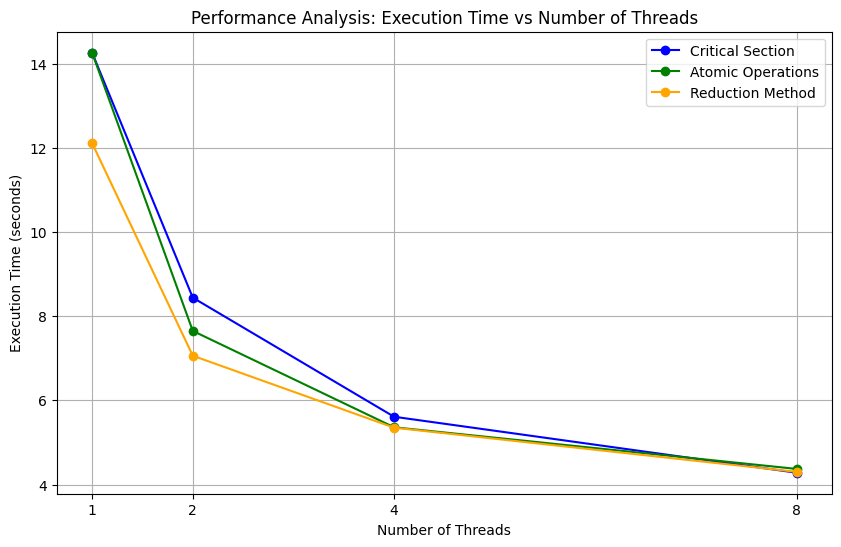

In [ ]:
import matplotlib.pyplot as plt

# Recorded execution times
thread_counts = [1, 2, 4, 8]
critical_times = [14.26, 8.44, 5.61, 4.28]  # Critical Section times
atomic_times = [14.26, 7.65, 5.36, 4.37]    # Atomic Operation times
reduction_times = [12.11, 7.06, 5.35, 4.30] # Reduction Method times

plt.figure(figsize=(10, 6))

plt.plot(thread_counts, critical_times, marker='o', label='Critical Section', color='blue')
plt.plot(thread_counts, atomic_times, marker='o', label='Atomic Operations', color='green')
plt.plot(thread_counts, reduction_times, marker='o', label='Reduction Method', color='orange')


plt.title("Performance Analysis: Execution Time vs Number of Threads")
plt.xlabel("Number of Threads")
plt.ylabel("Execution Time (seconds)")
plt.xticks(thread_counts)
plt.legend()
plt.grid(True)

plt.show()
